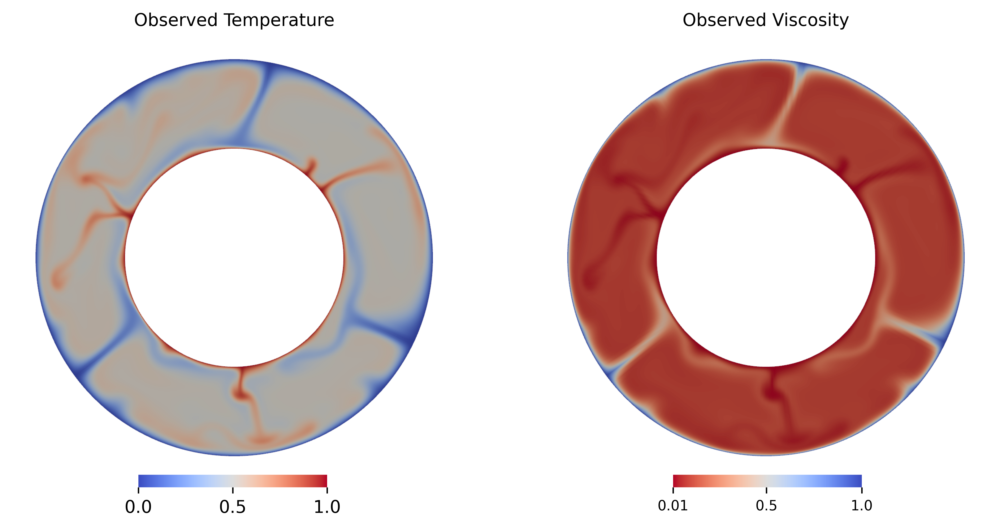

In [79]:
import matplotlib.pyplot as plt
import pyvista as pv
import os

# Load the VTU file
filename = "fields-visualisation/fields-visualisation_0.vtu"
data = pv.read(filename)

# Extract Temperature and Viscosity fields
temperature_field = 'Temperature'
viscosity_field = 'Observed Viscosity'

# Create a 1x2 subplot grid
fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=600)  # Adjust figure size as needed
axes = axes.flatten()

# Plot Temperature
plotter_temp = pv.Plotter(off_screen=True, window_size=[1080, 1080])  # Square window
plotter_temp.add_mesh(data, scalars=temperature_field, cmap="coolwarm", show_scalar_bar=False)
plotter_temp.camera_position = "xy"
plotter_temp.camera.zoom(1.3)
plotter_temp.screenshot("temp_field.png")  # Save a temporary screenshot

img_temp = plt.imread("temp_field.png")
axes[0].imshow(img_temp)
axes[0].set_title("Observed Temperature", fontsize=10)
axes[0].axis('off')  # Turn off axis
os.remove("temp_field.png")  # Remove the temporary file

# Plot Viscosity
plotter_visc = pv.Plotter(off_screen=True, window_size=[1080, 1080])  # Square window
plotter_visc.add_mesh(data, scalars=viscosity_field, cmap="coolwarm_r", show_scalar_bar=False)  # Reversed colormap
plotter_visc.camera_position = "xy"
plotter_visc.camera.zoom(1.3)
plotter_visc.screenshot("visc_field.png")  # Save a temporary screenshot

img_visc = plt.imread("visc_field.png")
axes[1].imshow(img_visc)
axes[1].set_title("Observed Viscosity", fontsize=10)
axes[1].axis('off')  # Turn off axis
os.remove("visc_field.png")  # Remove the temporary file

# Create color bars for both subplots
# Temperature color bar
temp_min, temp_max = data.point_data[temperature_field].min(), data.point_data[temperature_field].max()
cbar_ax_temp = fig.add_axes([0.225, 0.13, 0.15, 0.02])  # Adjust position (closer and centered)
norm_temp = plt.Normalize(vmin=temp_min, vmax=temp_max)
cbar_temp = plt.colorbar(
    plt.cm.ScalarMappable(cmap="coolwarm", norm=norm_temp),
    cax=cbar_ax_temp,
    orientation="horizontal"
)
cbar_temp.outline.set_visible(False)  # Remove outline

# Viscosity color bar
visc_min, visc_max = data.point_data[viscosity_field].min(), data.point_data[viscosity_field].max()
cbar_ax_visc = fig.add_axes([0.650, 0.13, 0.15, 0.02])  # Adjust position (closer and centered)
norm_visc = plt.Normalize(vmin=visc_min, vmax=visc_max)
cbar_visc = plt.colorbar(
    plt.cm.ScalarMappable(cmap="coolwarm_r", norm=norm_visc),
    cax=cbar_ax_visc,
    orientation="horizontal"
)
# Explicitly set ticks to include 0.01
cbar_visc.set_ticks([0.01, 0.5, 1])
cbar_visc.ax.set_xticklabels(["0.01", "0.5", "1.0"], fontsize=8)

cbar_visc.outline.set_visible(False)  # Remove outline

# Adjust layout and fix spacing
# plt.tight_layout()
plt.show()


In [80]:
# plot the fields of our need
import matplotlib.pyplot as plt
import pyvista as pv
from matplotlib.patches import FancyArrowPatch
import numpy as np
import os

# load the vtu file
filename = "fields-visualisation/fields-visualisation_0.vtu"

# print all the fields in the vtu file after reading it
data = pv.read(filename)
print(data.point_data.keys())



['Dynamic Topography', 'Observed Dynamic Topography', 'Observed Velocity', 'Viscosity', 'Observed Viscosity', 'Velocity', 'Temperature', 'Average_Viscosity', 'Viscosity_Error']


/var/folders/4f/s6d2d9j920v6m6mvz2gbkqkr0000gn/T/ipykernel_51057/4108794288.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


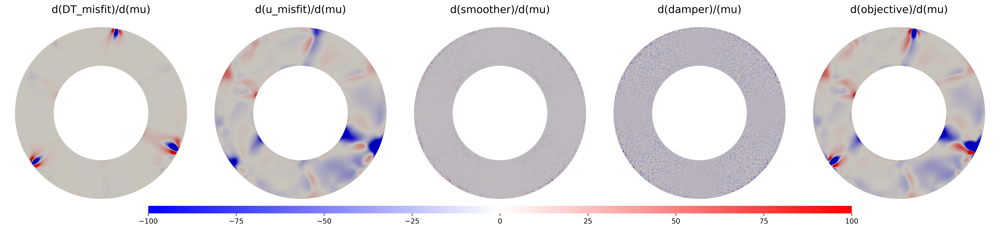

In [83]:
# plot 5 fields 'derivative', 'derivative_topography', 'derivative_velocity', 'derivative_smoother', 'derivative_damper'
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import pyvista as pv
import os

# load the vtu file
filename = 'derivative-visualisation/derivative-visualisation_0.vtu'
data = pv.read(filename)

#  extract the fields
derivative = data['derivative']
derivative_topography = data['derivative_topography']
derivative_velocity = data['derivative_velocity']
derivative_smoother = data['derivative_smoother']
derivative_damper = data['derivative_damper']

#  create a 1x5 subplots
fig, axes = plt.subplots(1, 5, figsize=(20, 5), dpi = 600)
axes = axes.flatten()

# plot derivative topography
plotter_derivative_topography = pv.Plotter(off_screen=True, window_size=[1080, 1080])
plotter_derivative_topography.add_mesh(data, scalars=derivative_topography,  cmap='bwr', show_scalar_bar=False, clim=[-100, 100])
plotter_derivative_topography.camera_position = "xy"
plotter_derivative_topography.camera.zoom(1.3)
plotter_derivative_topography.screenshot("derivative_topography.png")

img_derivative_topography = plt.imread("derivative_topography.png")
axes[0].imshow(img_derivative_topography)
axes[0].set_title("d(DT_misfit)/d(mu)", fontsize=15)
axes[0].axis('off')
os.remove("derivative_topography.png")

# plot derivative velocity
plotter_derivative_velocity = pv.Plotter(off_screen=True, window_size=[1080, 1080])
plotter_derivative_velocity.add_mesh(data, scalars=derivative_velocity,  cmap='bwr', show_scalar_bar=False, clim=[-100, 100])
plotter_derivative_velocity.camera_position = "xy"
plotter_derivative_velocity.camera.zoom(1.3)
plotter_derivative_velocity.screenshot("derivative_velocity.png")

img_derivative_velocity = plt.imread("derivative_velocity.png")
axes[1].imshow(img_derivative_velocity)
axes[1].set_title("d(u_misfit)/d(mu)", fontsize=15)
axes[1].axis('off')
os.remove("derivative_velocity.png")

# plot derivative smoother
plotter_derivative_smoother = pv.Plotter(off_screen=True, window_size=[1080, 1080])
plotter_derivative_smoother.add_mesh(data, scalars=derivative_smoother,  cmap='bwr', show_scalar_bar=False)
plotter_derivative_smoother.camera_position = "xy"
plotter_derivative_smoother.camera.zoom(1.3)
plotter_derivative_smoother.screenshot("derivative_smoother.png")

img_derivative_smoother = plt.imread("derivative_smoother.png")
axes[2].imshow(img_derivative_smoother)
axes[2].set_title("d(smoother)/d(mu)", fontsize=15)
axes[2].axis('off')
os.remove("derivative_smoother.png")

# plot derivative damper
plotter_derivative_damper = pv.Plotter(off_screen=True, window_size=[1080, 1080])
plotter_derivative_damper.add_mesh(data, scalars=derivative_damper,  cmap='bwr', show_scalar_bar=False)
plotter_derivative_damper.camera_position = "xy"
plotter_derivative_damper.camera.zoom(1.3)
plotter_derivative_damper.screenshot("derivative_damper.png")

img_derivative_damper = plt.imread("derivative_damper.png")
axes[3].imshow(img_derivative_damper)
axes[3].set_title("d(damper)/(mu)", fontsize=15)
axes[3].axis('off')
os.remove("derivative_damper.png")

# plot derivative
plotter_derivative = pv.Plotter(off_screen=True, window_size=[1080, 1080])
plotter_derivative.add_mesh(data, scalars=derivative,  cmap='bwr', show_scalar_bar=False, clim=[-100, 100])
plotter_derivative.camera_position = "xy"
plotter_derivative.camera.zoom(1.3)
plotter_derivative.screenshot("derivative.png")

img_derivative = plt.imread("derivative.png")
axes[4].imshow(img_derivative)
axes[4].set_title("d(objective)/d(mu)", fontsize=15)
axes[4].axis('off')
os.remove("derivative.png")

# Add a single color bar at the bottom
cbar_ax = fig.add_axes([0.15, 0.1, 0.7, 0.03])  # Position: [left, bottom, width, height]
norm = mcolors.Normalize(vmin=-100, vmax=100)
cbar = fig.colorbar(cm.ScalarMappable(norm=norm, cmap='bwr'), cax=cbar_ax, orientation='horizontal')
cbar.outline.set_visible(False)


# Adjust layout and fix spacing
plt.tight_layout()
plt.show()





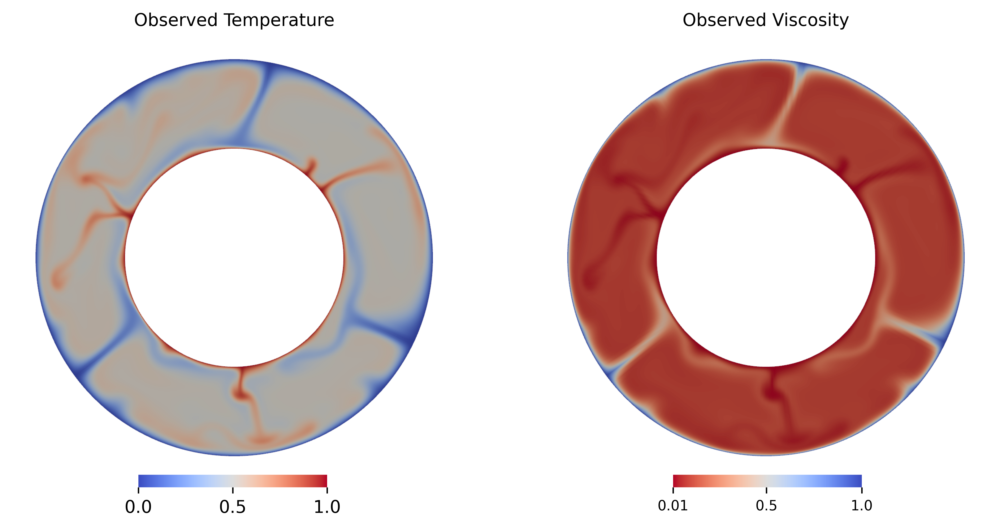

In [84]:
import matplotlib.pyplot as plt
import pyvista as pv
import os

# Load the VTU file
filename = "fields-visualisation/fields-visualisation_0.vtu"
data = pv.read(filename)

# Extract Temperature and Viscosity fields
temperature_field = 'Temperature'
viscosity_field = 'Observed Viscosity'

# Create a 1x2 subplot grid
fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=600)  # Adjust figure size as needed
axes = axes.flatten()

# Plot Temperature
plotter_temp = pv.Plotter(off_screen=True, window_size=[1080, 1080])  # Square window
plotter_temp.add_mesh(data, scalars=temperature_field, cmap="coolwarm", show_scalar_bar=False)
plotter_temp.camera_position = "xy"
plotter_temp.camera.zoom(1.3)
plotter_temp.screenshot("temp_field.png")  # Save a temporary screenshot

img_temp = plt.imread("temp_field.png")
axes[0].imshow(img_temp)
axes[0].set_title("Observed Temperature", fontsize=10)
axes[0].axis('off')  # Turn off axis
os.remove("temp_field.png")  # Remove the temporary file

# Plot Viscosity
plotter_visc = pv.Plotter(off_screen=True, window_size=[1080, 1080])  # Square window
plotter_visc.add_mesh(data, scalars=viscosity_field, cmap="coolwarm_r", show_scalar_bar=False)  # Reversed colormap
plotter_visc.camera_position = "xy"
plotter_visc.camera.zoom(1.3)
plotter_visc.screenshot("visc_field.png")  # Save a temporary screenshot

img_visc = plt.imread("visc_field.png")
axes[1].imshow(img_visc)
axes[1].set_title("Observed Viscosity", fontsize=10)
axes[1].axis('off')  # Turn off axis
os.remove("visc_field.png")  # Remove the temporary file

# Create color bars for both subplots
# Temperature color bar
temp_min, temp_max = data.point_data[temperature_field].min(), data.point_data[temperature_field].max()
cbar_ax_temp = fig.add_axes([0.225, 0.13, 0.15, 0.02])  # Adjust position (closer and centered)
norm_temp = plt.Normalize(vmin=temp_min, vmax=temp_max)
cbar_temp = plt.colorbar(
    plt.cm.ScalarMappable(cmap="coolwarm", norm=norm_temp),
    cax=cbar_ax_temp,
    orientation="horizontal"
)
cbar_temp.outline.set_visible(False)  # Remove outline

# Viscosity color bar
visc_min, visc_max = data.point_data[viscosity_field].min(), data.point_data[viscosity_field].max()
cbar_ax_visc = fig.add_axes([0.650, 0.13, 0.15, 0.02])  # Adjust position (closer and centered)
norm_visc = plt.Normalize(vmin=visc_min, vmax=visc_max)
cbar_visc = plt.colorbar(
    plt.cm.ScalarMappable(cmap="coolwarm_r", norm=norm_visc),
    cax=cbar_ax_visc,
    orientation="horizontal"
)
# Explicitly set ticks to include 0.01
cbar_visc.set_ticks([0.01, 0.5, 1])
cbar_visc.ax.set_xticklabels(["0.01", "0.5", "1.0"], fontsize=8)

cbar_visc.outline.set_visible(False)  # Remove outline

# Adjust layout and fix spacing
# plt.tight_layout()
plt.show()


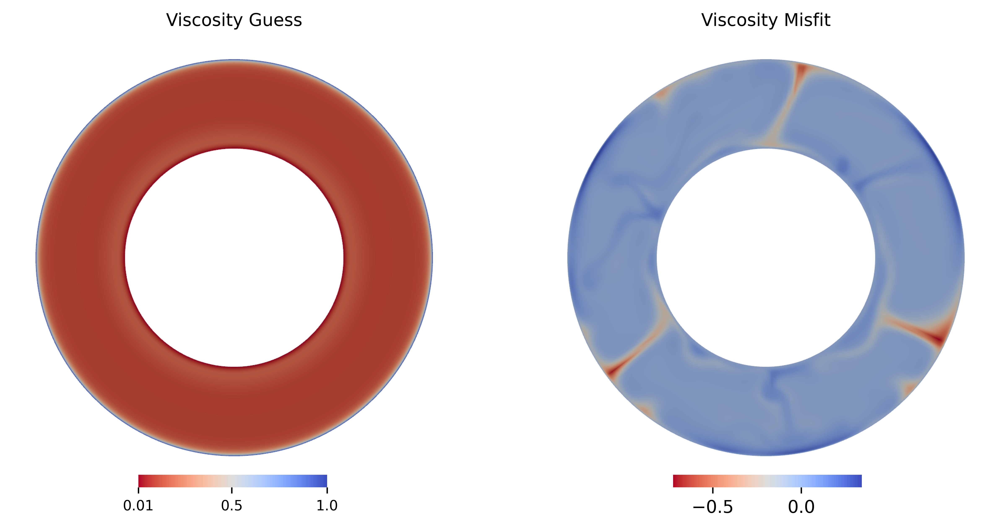

In [52]:
# plotting viscosity and viscosity error
import matplotlib.pyplot as plt
import pyvista as pv
import os

# Load the VTU file
filename = "fields-visualisation/fields-visualisation.vtu"
data = pv.read(filename)

# Extract Viscosity and Viscosity Error fields
viscosity_field = 'Viscosity'
viscosity_error_field = 'Viscosity_Error'

# Create a 1x2 subplot grid
fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=600)  # Adjust figure size as needed
axes = axes.flatten()

# Plot Viscosity
plotter_visc = pv.Plotter(off_screen=True, window_size=[1080, 1080])  # Square window
plotter_visc.add_mesh(data, scalars=viscosity_field, cmap="coolwarm_r", show_scalar_bar=False)  # Reversed colormap
plotter_visc.camera_position = "xy"
plotter_visc.camera.zoom(1.3)
plotter_visc.screenshot("visc_field.png")  # Save a temporary screenshot

img_visc = plt.imread("visc_field.png")
axes[0].imshow(img_visc)
axes[0].set_title("Viscosity Guess", fontsize=10)
axes[0].axis('off')  # Turn off axis
os.remove("visc_field.png")  # Remove the temporary file

# Plot Viscosity Error
plotter_visc_error = pv.Plotter(off_screen=True, window_size=[1080, 1080])  # Square window
plotter_visc_error.add_mesh(data, scalars=viscosity_error_field, cmap="coolwarm_r", show_scalar_bar=False)
plotter_visc_error.camera_position = "xy"
plotter_visc_error.camera.zoom(1.3)
plotter_visc_error.screenshot("visc_error_field.png")  # Save a temporary screenshot

img_visc_error = plt.imread("visc_error_field.png")
axes[1].imshow(img_visc_error)
axes[1].set_title("Viscosity Misfit", fontsize=10)
axes[1].axis('off')  # Turn off axis
os.remove("visc_error_field.png")  # Remove the temporary file

# Create color bars for both subplots
# Viscosity color bar
visc_min, visc_max = data.point_data[viscosity_field].min(), data.point_data[viscosity_field].max()
cbar_ax_visc = fig.add_axes([0.225, 0.13, 0.15, 0.02])  # Adjust position (closer and centered)
norm_visc = plt.Normalize(vmin=visc_min, vmax=visc_max)
cbar_visc = plt.colorbar(
    plt.cm.ScalarMappable(cmap="coolwarm_r", norm=norm_visc),
    cax=cbar_ax_visc,
    orientation="horizontal"
)
cbar_visc.outline.set_visible(False)  # Remove outline
# Explicitly set ticks to include 0.01
cbar_visc.set_ticks([0.01, 0.5, 1])
cbar_visc.ax.set_xticklabels(["0.01", "0.5", "1.0"], fontsize=8)

# Viscosity Error color bar
visc_error_min, visc_error_max = data.point_data[viscosity_error_field].min(), data.point_data[viscosity_error_field].max()
cbar_ax_visc_error = fig.add_axes([0.650, 0.13, 0.15, 0.02])  # Adjust position (closer and centered)
norm_visc_error = plt.Normalize(vmin=visc_error_min, vmax=visc_error_max)
cbar_visc_error = plt.colorbar(
    plt.cm.ScalarMappable(cmap="coolwarm_r", norm=norm_visc_error),
    cax=cbar_ax_visc_error,
    orientation="horizontal"
)
cbar_visc_error.outline.set_visible(False)  # Remove outline

# Adjust layout and fix spacing
# plt.tight_layout()
plt.show()

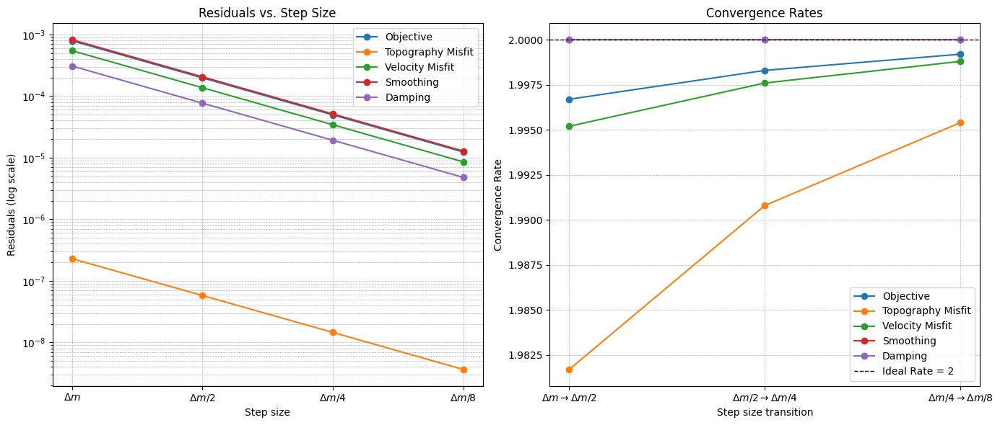

In [75]:
import numpy as np
import matplotlib.pyplot as plt

# Residuals and convergence rates for each category
residuals = {
    "Objective": [0.0007877, 0.0001973, 4.9405e-05, 1.2358e-05],
    "Topography Misfit": [2.2868e-07, 5.7902e-08, 1.4568e-08, 3.6537e-09],
    "Velocity Misfit": [0.0005443, 0.0001365, 3.4189e-05, 8.5544e-06],
    "Smoothing": [0.0008187, 0.0002047, 5.1166e-05, 1.2791e-05],
    "Damping": [0.0003065, 7.6613e-05, 1.9153e-05, 4.7883e-06],
}

convergence_rates = {
    "Objective": [1.9967, 1.9983, 1.9992],
    "Topography Misfit": [1.9817, 1.9908, 1.9954],
    "Velocity Misfit": [1.9952, 1.9976, 1.9988],
    "Smoothing": [2.0000, 2.0000, 2.0000],
    "Damping": [2.0000, 2.0000, 2.0000],
}

# X-axis labels
deltas_residuals = [r"$\Delta m$", r"$\Delta m / 2$", r"$\Delta m / 4$", r"$\Delta m / 8$"]
deltas_convergence = [r"$\Delta m \to \Delta m / 2$", r"$\Delta m / 2 \to \Delta m / 4$", r"$\Delta m / 4 \to \Delta m / 8$"]
x_residuals = np.arange(len(deltas_residuals))
x_convergence = np.arange(len(deltas_convergence))

# Plotting residuals
plt.figure(figsize=(14, 6))

# Left Panel: Residuals
plt.subplot(1, 2, 1)
for label, res in residuals.items():
    plt.plot(x_residuals, res, marker="o", label=label)
plt.yscale("log")
plt.xticks(x_residuals, deltas_residuals)
plt.xlabel("Step size")
plt.ylabel("Residuals (log scale)")
plt.title("Residuals vs. Step Size")
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)

# Right Panel: Convergence Rates
plt.subplot(1, 2, 2)
for label, rates in convergence_rates.items():
    plt.plot(x_convergence, rates, marker="o", label=label)
plt.axhline(y=2, color="k", linestyle="--", linewidth=1, label="Ideal Rate = 2")
plt.xticks(x_convergence, deltas_convergence)
plt.xlabel("Step size transition")
plt.ylabel("Convergence Rate")
plt.title("Convergence Rates")
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)

plt.tight_layout()
plt.show()
